In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import os
sns.set_theme()

In [2]:
data_dir = "/oak/stanford/groups/akundaje/atwang/gp_mouse_chrombpnet_results/assembly/mm10/scores_merged"
summary_path = os.path.join(data_dir, "summary_profiles.tsv")
data_path = os.path.join(data_dir, "data_profiles.tsv")



# Summary Visualizations

Here, I visualize some summary statistics for each cell type across tested mouse peaks

In [3]:
summary = pd.read_csv(summary_path, sep='\t', header=0)
summary


,label,fdr10,fdr1,npeaks,coverage
0,l-mCM,0.557914,0.062451,64354,4.166558
1,Macro,0.509772,0.060640,68668,4.181930
2,mCM-1-2,0.772715,0.105012,120272,4.903940
3,FB-1,0.757648,0.097196,106692,4.838299
4,pCM-3,0.480433,0.055758,166560,6.027319
5,mCM-1-1,0.930684,0.165919,77327,4.376700
6,pCM-1,0.773090,0.107085,121894,5.008693
7,pCM-2,0.830362,0.120256,133266,5.604095
8,mCM-1-3,0.881360,0.137730,162804,5.819879
9,FB-3,0.995951,0.888867,117553,4.642712


## Proportion of significant peaks for each cell type

The proportion of significant peaks in each cell type, at an FDR threshold of 10% and 1%. It looks like this proportion varies substantially across cell types for both thresholds. 

This could indicate cell-type-specific effects, but we want to account for possible confounders.

<AxesSubplot: xlabel='fdr10', ylabel='label'>

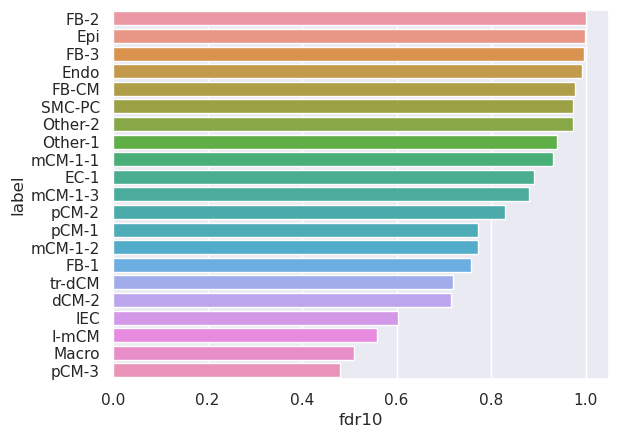

In [4]:
sns.barplot(data=summary, y="label", x="fdr10", order=summary.sort_values('fdr10', ascending=False).label)


<AxesSubplot: xlabel='fdr1', ylabel='label'>

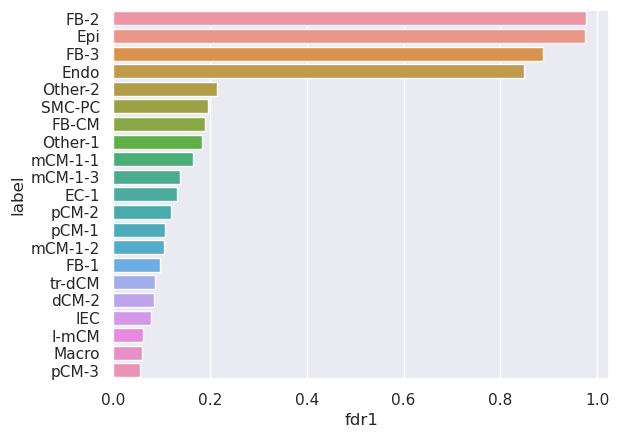

In [5]:
sns.barplot(data=summary, y="label", x="fdr1", order=summary.sort_values('fdr1', ascending=False).label)


## Significance vs. coverage

One potential confounder is varying read depths across cell types, which could impact model performance. 

Here, I plot the mean peak coverage (defined as log1p counts per peak) along with the proportion of significant peaks. They do not look correlated which indicates that the results are not confounded by coverage

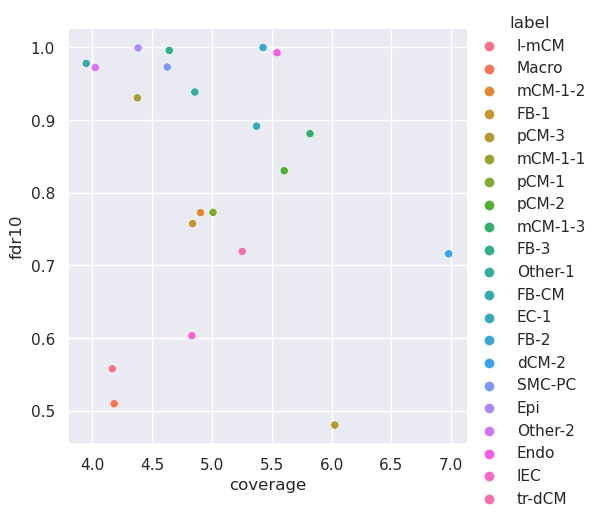

In [6]:
sns.relplot(data=summary, x="coverage", y="fdr10", hue="label")


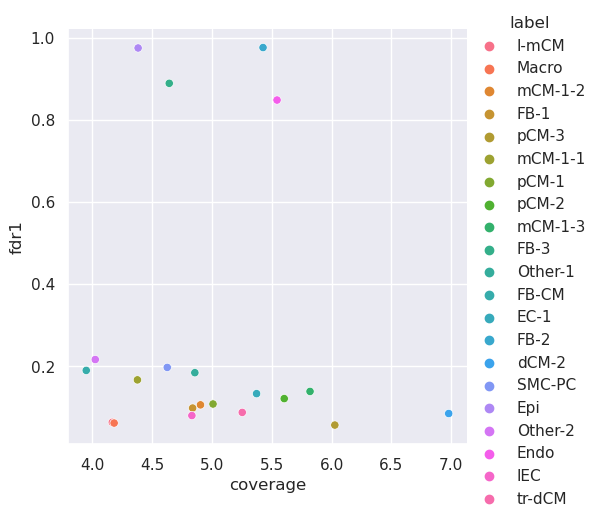

In [7]:
sns.relplot(data=summary, x="coverage", y="fdr1", hue="label")


## Significance vs. peak counts

Another potential confounder is the variable number of total peaks, since peak calling was done independently on each cell type. 

I plot the number of peaks along with the proportion of significant peaks. They do not look correlated either.

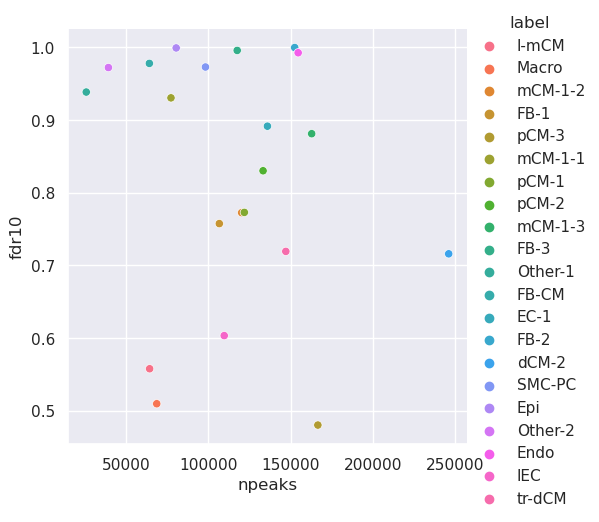

In [8]:
sns.relplot(data=summary, x="npeaks", y="fdr10", hue="label")


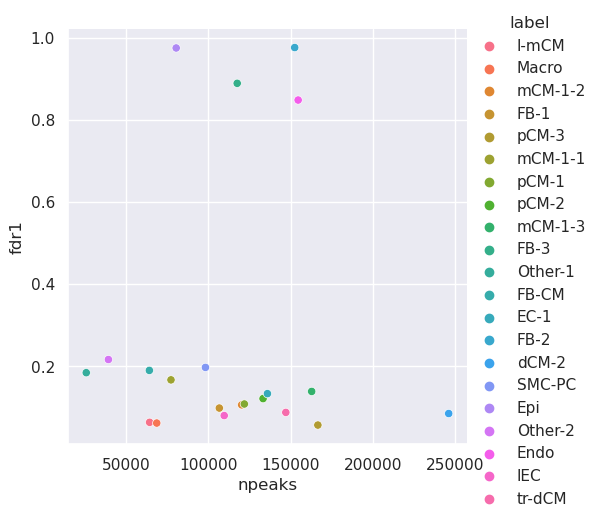

In [9]:
sns.relplot(data=summary, x="npeaks", y="fdr1", hue="label")


# Per-Peak Visualizations

Now, I look into the distributions of several metrics across individual mouse peaks.

In [10]:

data = pd.read_csv(data_path, sep='\t', header=0)
data

,chrom,summit_pos,ss_self_jsd_mean,xs_self_jsd_mean,cross_jsd_mean,prof_e_dist,prof_nlp,prof_nlq,log1p_true_counts,fold_0_ss,...,diff_std,u_stat_ss,u_stat_xs,-log10p,-log10q,u_stat_ss_qn,u_stat_xs_qn,-log10p_qn,-log10q_qn,Label
0,chr1,78607020,0.079865,0.100282,0.466963,0.753779,inf,inf,2.944439,-1.702723,...,0.092077,0.0,25.0,2.100371,0.975202,0.0,25.0,2.100371,0.839570,l-mCM
1,chrX,170671776,0.092658,0.102848,0.351726,0.507946,2.100371,1.480133,3.332205,-1.217577,...,0.074441,0.0,25.0,2.100371,0.975202,0.0,25.0,2.100371,0.839570,l-mCM
2,chr7,138592479,0.171463,0.121773,0.381601,0.469966,inf,inf,4.488636,-0.685603,...,0.111021,2.0,23.0,1.498311,0.763307,4.0,21.0,1.021189,0.437820,l-mCM
3,chr14,12536667,0.181408,0.120142,0.365281,0.429012,2.100371,1.480133,4.007333,-1.251218,...,0.126282,2.0,23.0,1.498311,0.763307,3.0,22.0,1.255273,0.535789,l-mCM
4,chr8,71432074,0.174255,0.130741,0.354656,0.404316,2.100371,1.480133,4.844187,-1.164928,...,0.140883,2.0,23.0,1.498311,0.763307,5.0,20.0,0.821617,0.350081,l-mCM
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2393287,chr7,122979785,0.088188,0.085004,0.107914,0.042635,0.274296,0.271259,4.510860,-1.382658,...,0.104497,18.0,7.0,0.509306,0.243559,19.0,6.0,0.653213,0.319659,tr-dCM
2393288,chr13,109788289,0.094736,0.095624,0.116227,0.042094,0.109144,0.108982,4.454347,-1.753352,...,0.082494,13.0,12.0,-0.000000,-0.000000,12.0,13.0,-0.000000,-0.000000,tr-dCM
2393289,chr11,59772057,0.091181,0.082913,0.107415,0.040736,0.160851,0.160337,4.672829,-0.972326,...,0.112904,8.0,17.0,0.376095,0.175785,9.0,16.0,0.261521,0.119385,tr-dCM
2393290,chrX,140996290,0.075451,0.063775,0.089855,0.040484,1.197281,1.040948,3.970292,-2.880192,...,0.216103,0.0,25.0,2.100371,0.978147,0.0,25.0,2.100371,0.987589,tr-dCM


Mean pairwise JSD within mouse folds, compared to mean pairwise JSD between mouse and GP folds

Color represents the true log counts in mouse

Note that cross-JSD rarely is less than same-JSD. This is likely due to the mathematical property that energy distance is non-negative

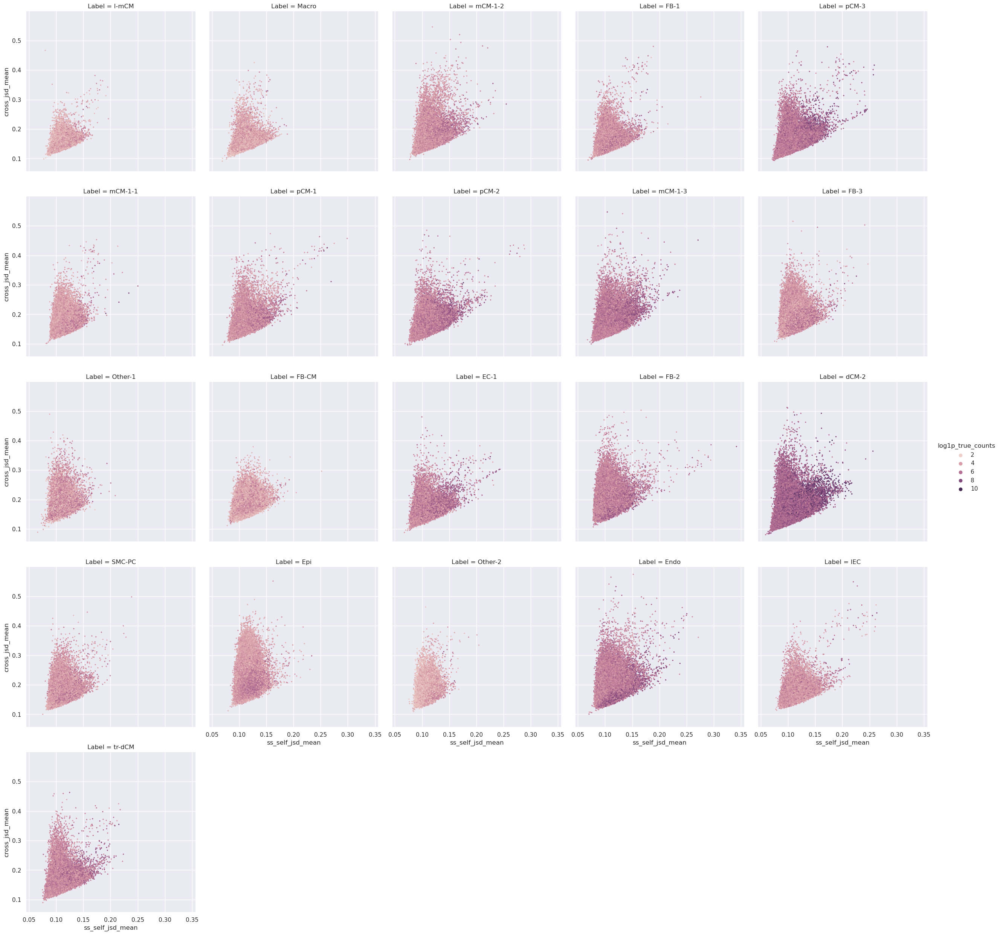

In [11]:
sns.relplot(data=data, x="ss_self_jsd_mean", y="cross_jsd_mean", col="Label", hue="log1p_true_counts", col_wrap=5, s=5, edgecolor=None)


Mean pairwise JSD within GP folds, compared to mean pairwise JSD between mouse and GP folds

Similar results to above

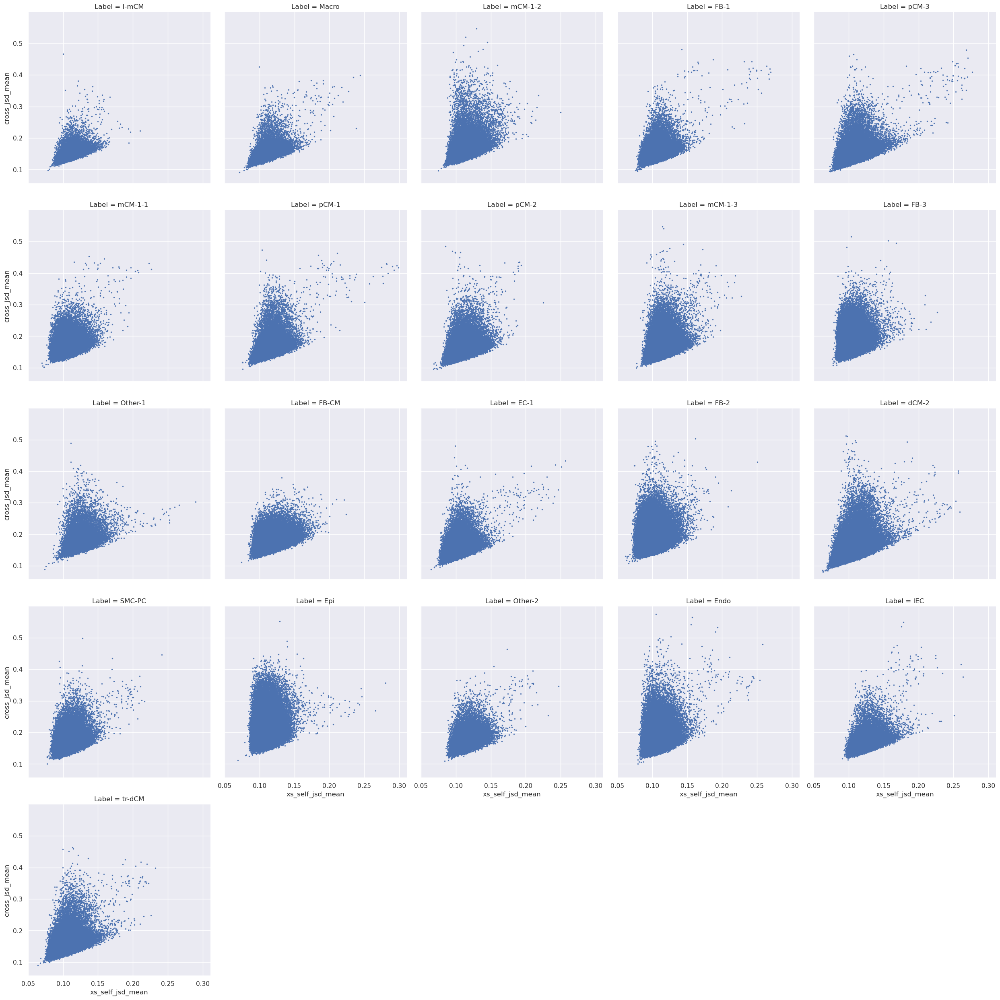

In [12]:
sns.relplot(data=data, x="ss_self_contrib_counts_dist_mean", y="xs_self_contrib_counts_dist_mean", col="Label", col_wrap=5, s=5, edgecolor=None)


In [ ]:
sns.relplot(data=data, x="ss_self_contrib_counts_dist_mean", y="xs_self_contrib_counts_dist_mean", col="Label", col_wrap=5, s=5, edgecolor=None)


Mean pairwise JSD within mouse folds, compared to mean pairwise JSD within GP folds

We see little correlation between the two species except at extreme values (i.e. it is unlikely to have an extremely high pairwise JSD within one species and an extremely low JSD within another). 

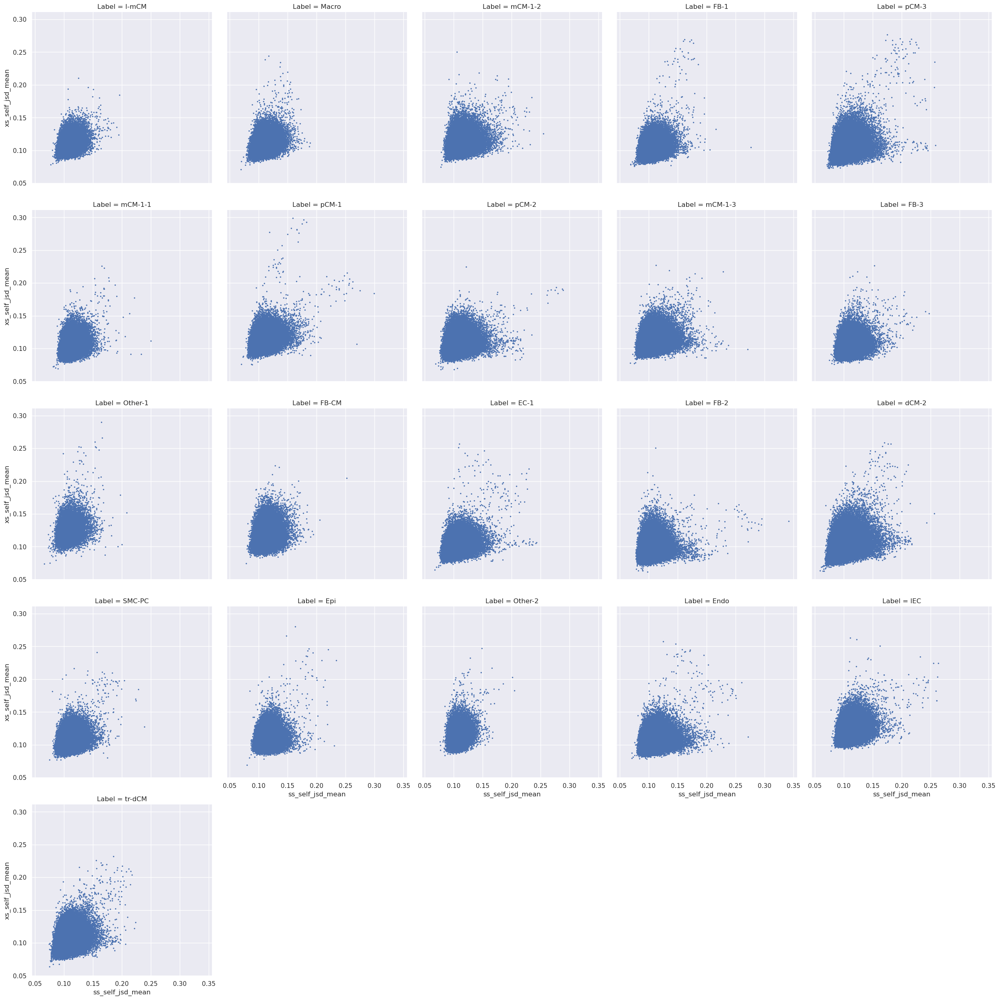

In [13]:
sns.relplot(data=data, x="ss_self_contrib_counts_dist_mean", y="cross_contrib_counts_dist_mean", col="Label", col_wrap=5, s=5, edgecolor=None)


Mean pairwise JSD between species vs. energy distance metric. Color represents significance calculated using a permutation test

Energy distance is defined as 2 * between - (same_mouse + same_gp) where "between" is the mean pairwise JSD between species, and "same_mouse" and "same_GP" are the mean pairwise JSDs within a species.

We see that energy distance is mostly driven by between-species JSD. Moreover, the lower the gap, the higher the significance. We furthermore see that the between-species JSD is much more variable than within-species JSD. (For the latter senario, we would see a fan-like pattern where everywhere below y=x has points, rather than a line-like pattern here.)

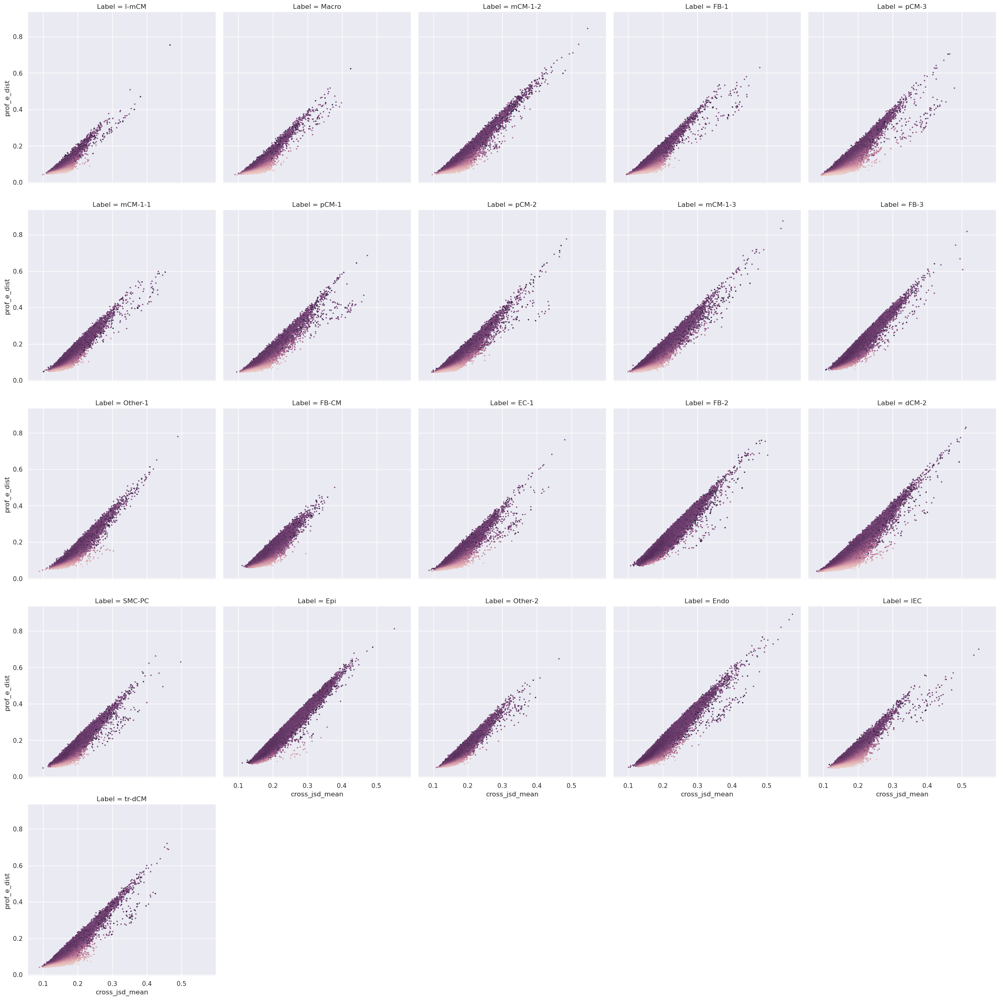

In [14]:
np.seterr(invalid='ignore')

sns.relplot(data=data, x="cross_jsd_mean", y="prof_e_dist", col="Label", hue="prof_nlp", hue_norm=(0,3), col_wrap=5, s=5, edgecolor=None)


## Counts vs. Profiles predictions

Here, we look at the profiles scores vs. the counts scores for each mouse peak

The x-axis is the mean count prediction difference between mouse and GP. A higher absolute value indicates a higher cross-species divergence.

The y-axis is the profile energy distance.

The color indicates significance of the profile scores.

If the counts and profile scores are highly correlated, then we would expect a v-shape relationship. However, we do not see this for the most part, indicating disagreements. The exception is at the very high end of the energy distances, which tends to be skewed towards peaks with higher count predictions in GP.

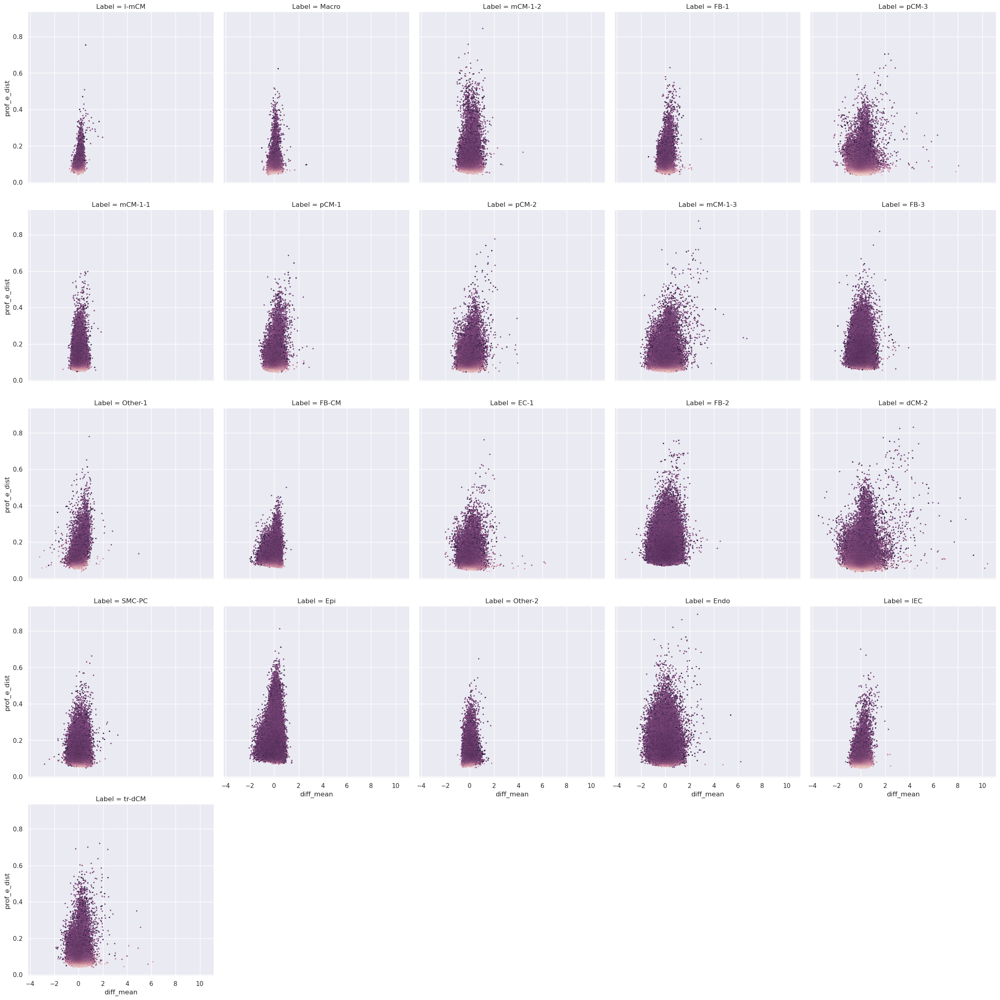

In [15]:
np.seterr(invalid='ignore')

sns.relplot(data=data, x="diff_mean", y="prof_e_dist", col="Label", hue="prof_nlp", hue_norm=(0,3), col_wrap=5, s=5, edgecolor=None)


Here, the color is the counts significance

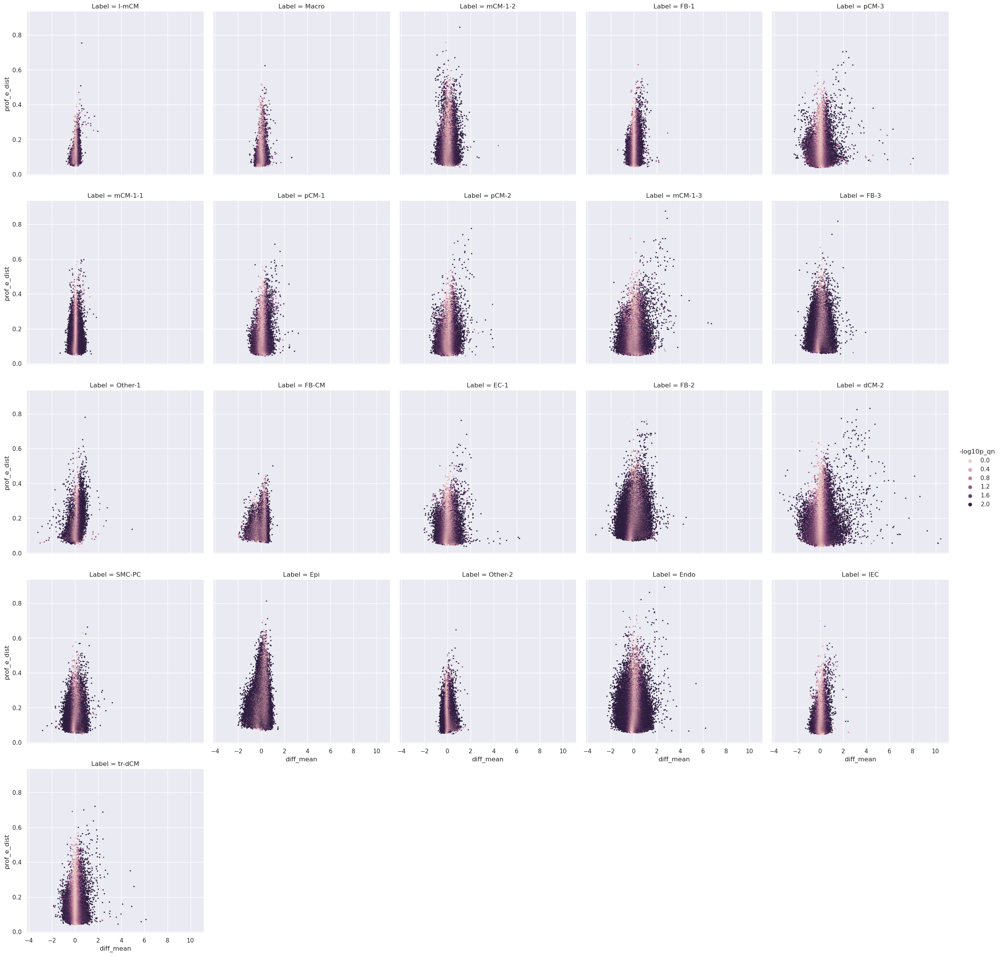

In [16]:
sns.relplot(data=data, x="diff_mean", y="prof_e_dist", col="Label", hue="-log10p_qn", col_wrap=5, s=5, edgecolor=None)


## Profile scores visualized on count predictions 

Lastly, we look at profiles scores on top of count predictions 

The x axis is the mean predicted log10 counts as predicted by the mouse models, averaged across 5 folds. The y axis is the mean predicted log10 counts as predicted by the GP models.

The color is the profile energy score.

We see the existence of some count prediction outliers (on the fringe) with very high profile scores in certain cell types. 

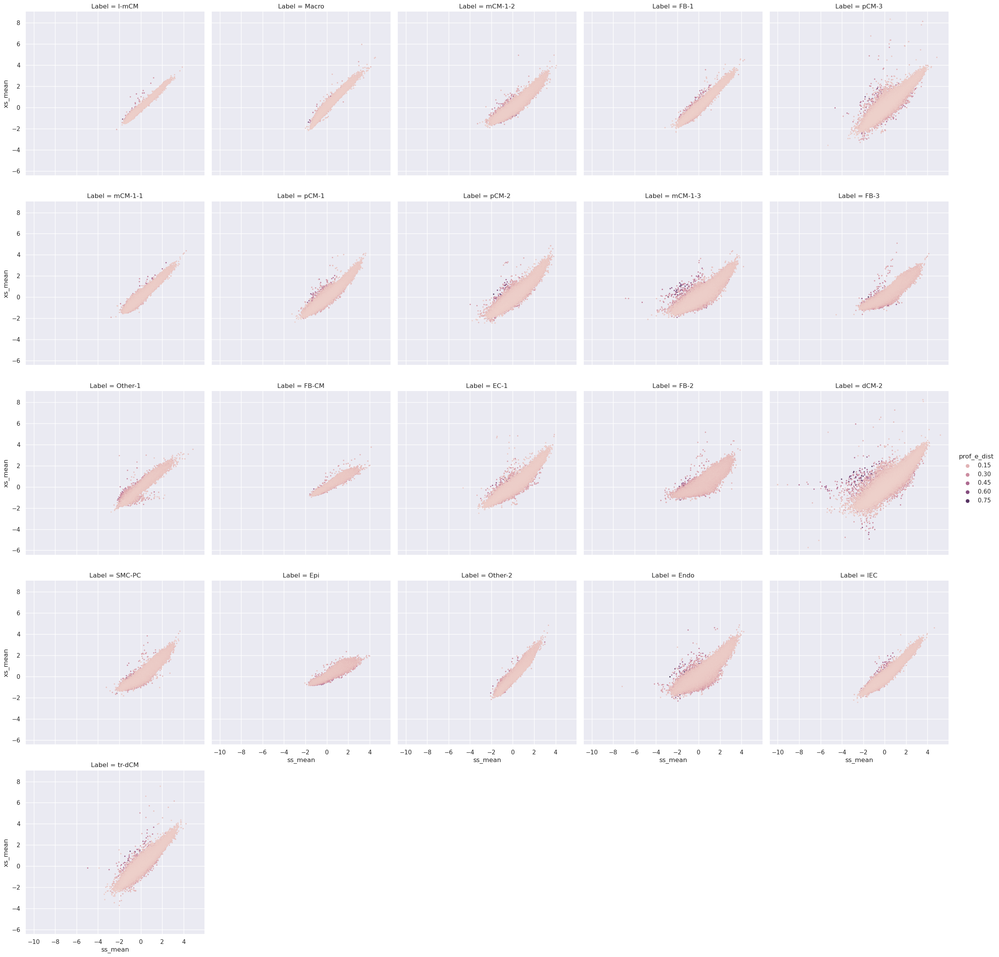

In [17]:
sns.relplot(data=data, x="ss_mean", y="xs_mean", hue="prof_e_dist", col="Label", col_wrap=5, s=5, edgecolor=None)


To make sure that this isn't a visual artifact, we threshold peaks with a profile energy score of > 0.4. Here, in certain cell types we see a bimodal distribution with a cluster of peaks from the "main" group and a cluster of peaks from the high-scoring group with higher predicted counts from the GP model. 

This supports the observation that there is a subset of peaks with both high count divergences and profile divergences. Perhaps these are the peaks we should prioritize.

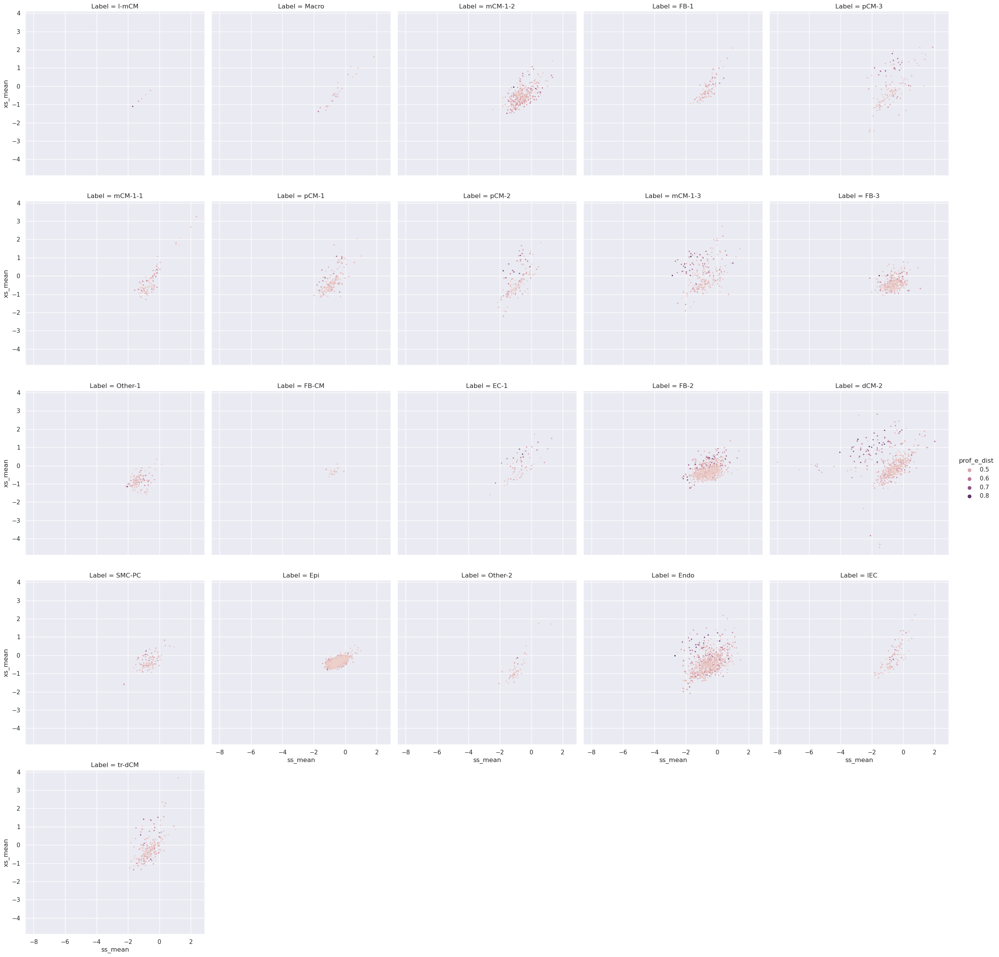

In [18]:
sns.relplot(data=data[data["prof_e_dist"] > 0.4], x="ss_mean", y="xs_mean", hue="prof_e_dist", col="Label", col_wrap=5, s=5, edgecolor=None)


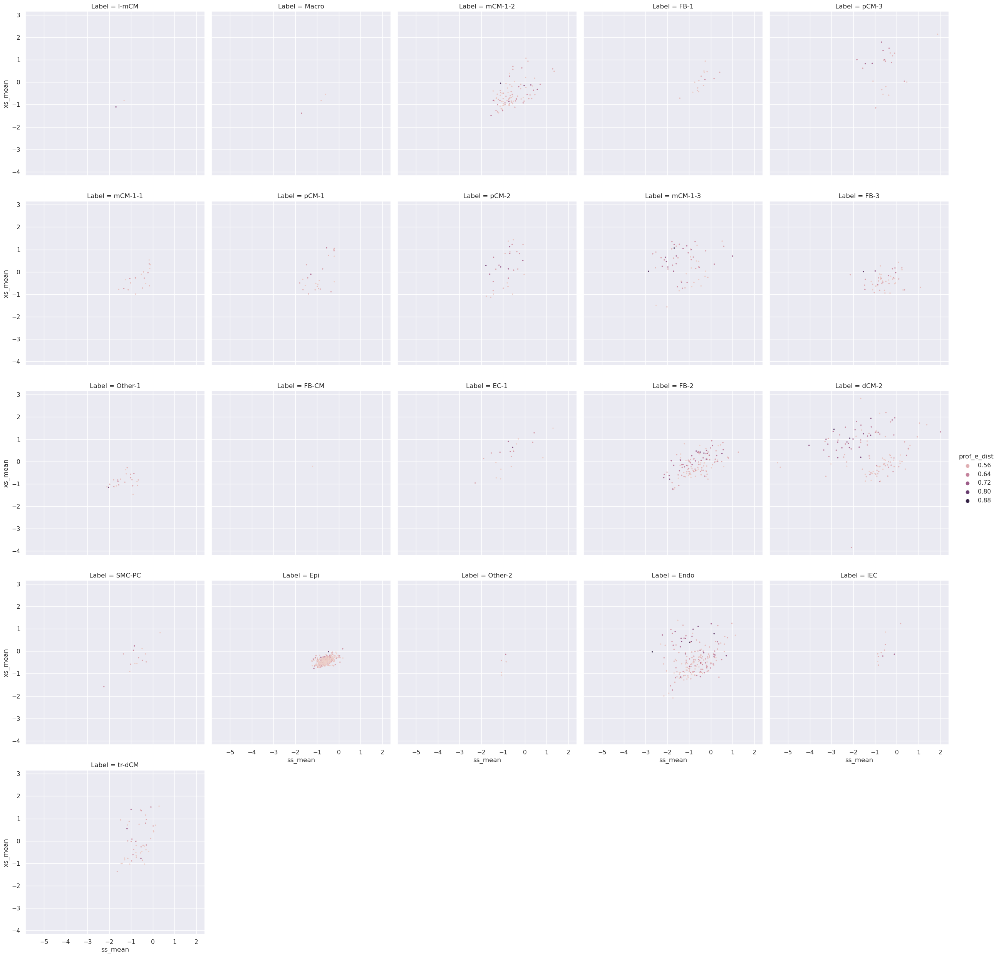

In [19]:
sns.relplot(data=data[data["prof_e_dist"] > 0.5], x="ss_mean", y="xs_mean", hue="prof_e_dist", col="Label", col_wrap=5, s=5, edgecolor=None)


## Predicted vs. True counts

We look a the fold 0 mouse model predictions compared the true counts on mouse peaks.  

The x axis is the predicted log10 counts as predicted by the mouse model. The y axis is the log1p true counts for the same peaks. Note that these values are on different scales but they are linearly related.

And as before, the color indicates the significance of the difference between species.

There seems to be an enrichment of significant peaks in inputs with low model predictive accuracy. This indicates potential false positives we should watch out for. 

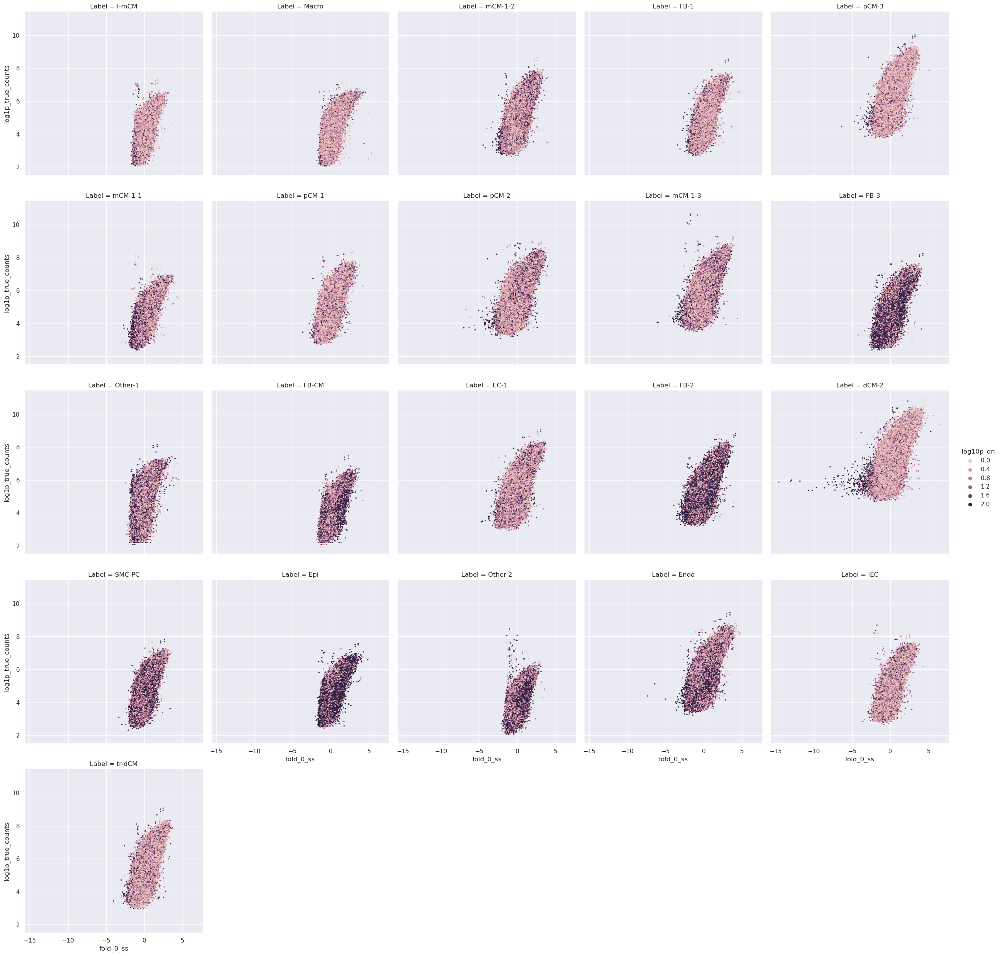

In [20]:
sns.relplot(data=data, x="fold_0_ss", y="log1p_true_counts", hue="-log10p_qn", col="Label", col_wrap=5, s=5, edgecolor=None)


## Predicted vs. predicted counts

We look a the fold 0 mouse model predictions compared the fold 1 mouse model predictions.  

The x axis is the predicted log10 counts as predicted by the fold 0 mouse model. The y axis is the predicted log10 counts as predicted by the fold 1 mouse model.

And as before, the color indicates the significance of the difference between species.

There seems to be an enrichment of significant peaks in inputs with low model predictive accuracy. This indicates potential false positives we should watch out for. 

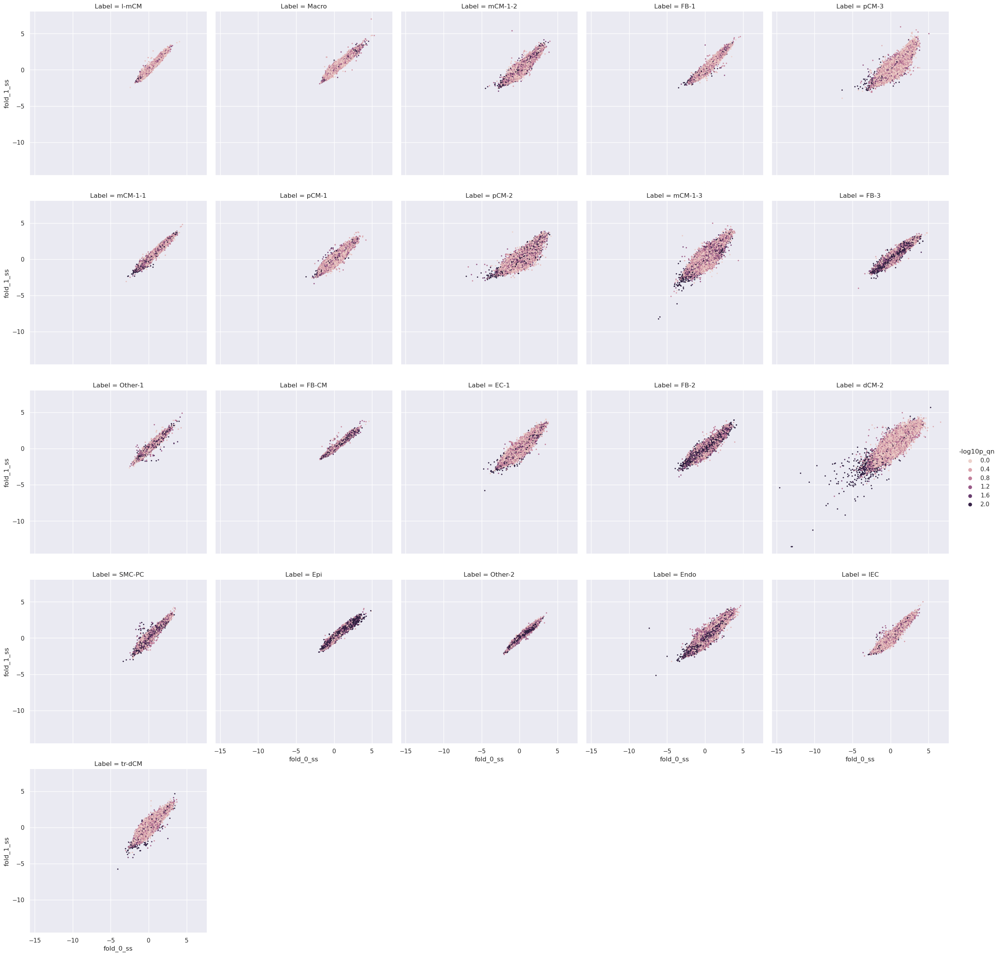

In [21]:
sns.relplot(data=data, x="fold_0_ss", y="fold_1_ss", hue="-log10p_qn", col="Label", col_wrap=5, s=5, edgecolor=None)


## Predicted vs. cross-species predicted counts

We look a the fold 0 mouse model predictions compared the fold 0 GP model predictions.  

The x axis is the predicted log10 counts as predicted by the fold 0 mouse model. The y axis is the predicted log10 counts as predicted by the fold 0 GP model.

And as before, the color indicates the significance of the difference between species.

As expected, significantly different peaks tend to be at the edges of the distribution

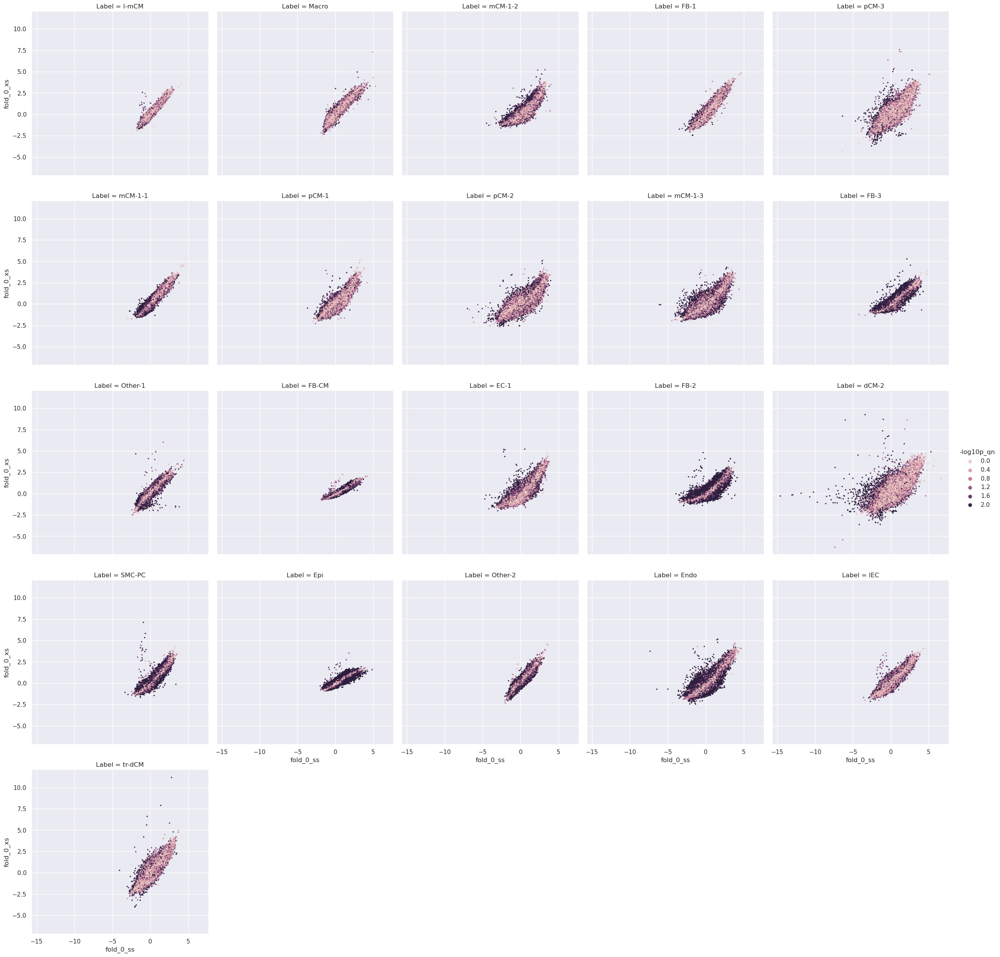

In [22]:
sns.relplot(data=data, x="fold_0_ss", y="fold_0_xs", hue="-log10p_qn", col="Label", col_wrap=5, s=5, edgecolor=None)


## Quantitative cross-species prediction performance

Lastly, we look at the predictive cross_species performance for each cell type using spearman correlation across peaks.

SpearmanSame is the correlation of predicted counts from two folds of mouse model. This serves as an upper bound of cross-species predictive performance

SpearmanCross is the correlation of predicted counts from a mouse model with the predicted counts from the corresponding GP model. 

SpearmanObserved is the correlation of observed counts from a mouse model with true observed mouse counts.

We see that SpearmanCross is substantially closer to SpearmanSame than to SpearmanObserved, indicating that the predicted counts between two species correspond much more strongly than the predicted vs. true counts in the same species

In [23]:
from scipy import stats

grouped = data.groupby("Label")
header = ["Label", "SpearmanSame", "SpearmanCross", "SpearmanObserved"]
records = []
for name, group in grouped:
    fold_0_ss = group[['fold_0_ss']].to_numpy()
    fold_1_ss = group[['fold_1_ss']].to_numpy()
    fold_0_xs = group[['fold_0_xs']].to_numpy()
    observed = group[['log1p_true_counts']].to_numpy()
    corr_ss = stats.spearmanr(fold_0_ss, fold_1_ss).correlation
    corr_xs = stats.spearmanr(fold_0_ss, fold_0_xs).correlation
    corr_observed = stats.spearmanr(fold_0_ss, observed).correlation
    records.append([name, corr_ss, corr_xs, corr_observed])
    
corrs = pd.DataFrame.from_records(records, columns=header)
corrs

,Label,SpearmanSame,SpearmanCross,SpearmanObserved
0,EC-1,0.918391,0.850169,0.741325
1,Endo,0.919469,0.801479,0.740185
2,Epi,0.968737,0.894602,0.775375
3,FB-1,0.954833,0.924396,0.733878
4,FB-2,0.918985,0.773677,0.753890
5,FB-3,0.942127,0.856249,0.738272
6,FB-CM,0.978523,0.947679,0.758052
7,Macro,0.954153,0.934741,0.747233
8,Other-1,0.974004,0.937242,0.715988
9,Other-2,0.983260,0.944193,0.813986
